# Min3Flow Pipeline

In [1]:
%load_ext autoreload
%autoreload 3

## Minimal Example

In [2]:
import torch
from min3flow.min3flow import Min3Flow

In [3]:
mflw = Min3Flow(global_seed=42)

### 1. Generate (with MinDalle)

In [4]:
%%time
prompt = 'Dali painting of a glider in infrared'
grid_size = 4 # Will create a grid of (4,4) images. Reduce this if running into OOM errors.
image = mflw.generate(prompt, grid_size=grid_size)

using device cuda
intializing TextTokenizer
initializing DalleBartEncoder
initializing DalleBartDecoder
initializing VQGanDetokenizer
tokenizing text
['Ġdali']
['Ġpainting']
['Ġof']
['Ġa']
['Ġglider']
['Ġin']
['Ġinfrared']
9 text tokens [0, 21853, 1545, 111, 58, 24228, 91, 15126, 2]
encoding text tokens
detokenizing image
CPU times: user 1min 15s, sys: 4.16 s, total: 1min 19s
Wall time: 34.1 s


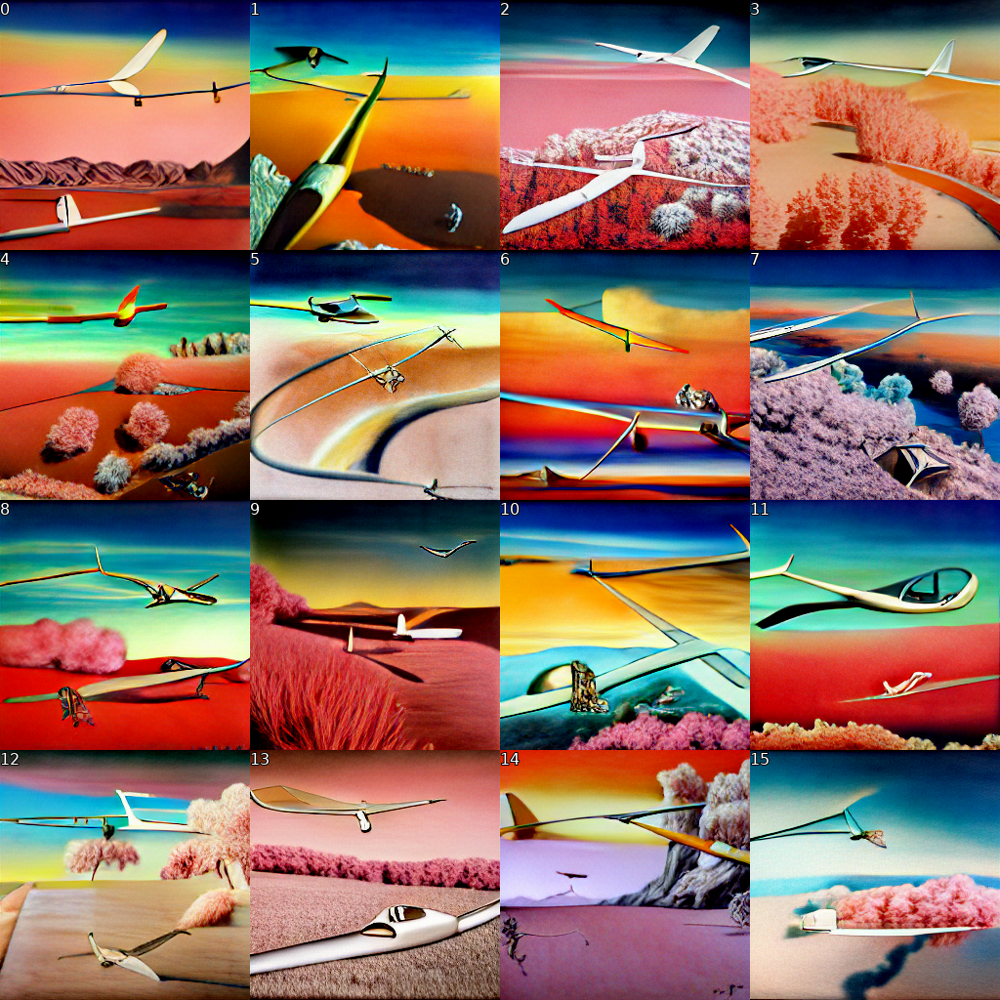

In [6]:
mflw.show_grid(image)

### 2. Diffuse (with Glid3XL)

In [7]:
%%time
Fav_id = 3
img_diff = mflw.diffuse(image, grid_idx=Fav_id)

Using last text prompt: "Dali painting of a glider in infrared"
load_models (5.60s)
load_clip (4.21s)
load_ldm (0.11s)
load_bert (5.08s)


  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 2min 6s, sys: 4.34 s, total: 2min 11s
Wall time: 32.4 s


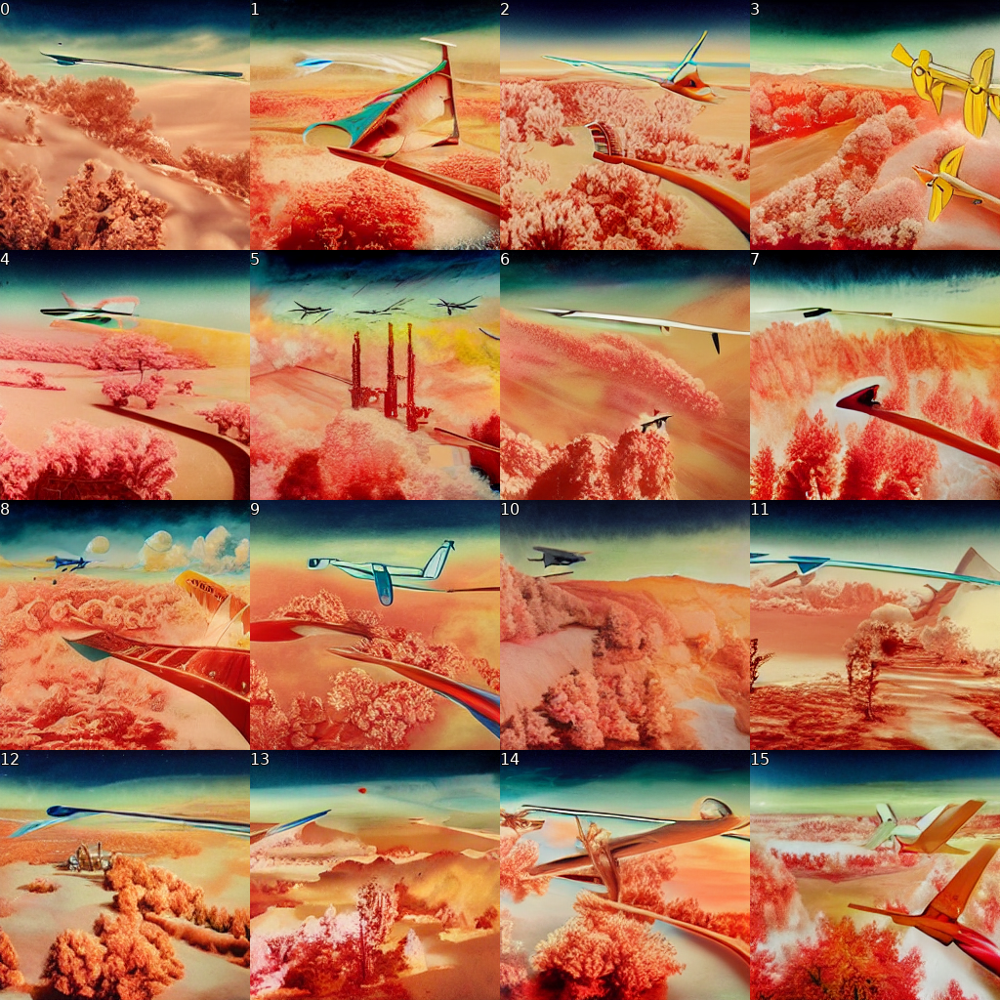

In [8]:
mflw.show_grid(img_diff)

### 3. Upsample (with SwinIR)

In [15]:
%%time
img_up = mflw.upscale(img_diff[9])

CPU times: user 46.7 s, sys: 27.4 ms, total: 46.7 s
Wall time: 941 ms


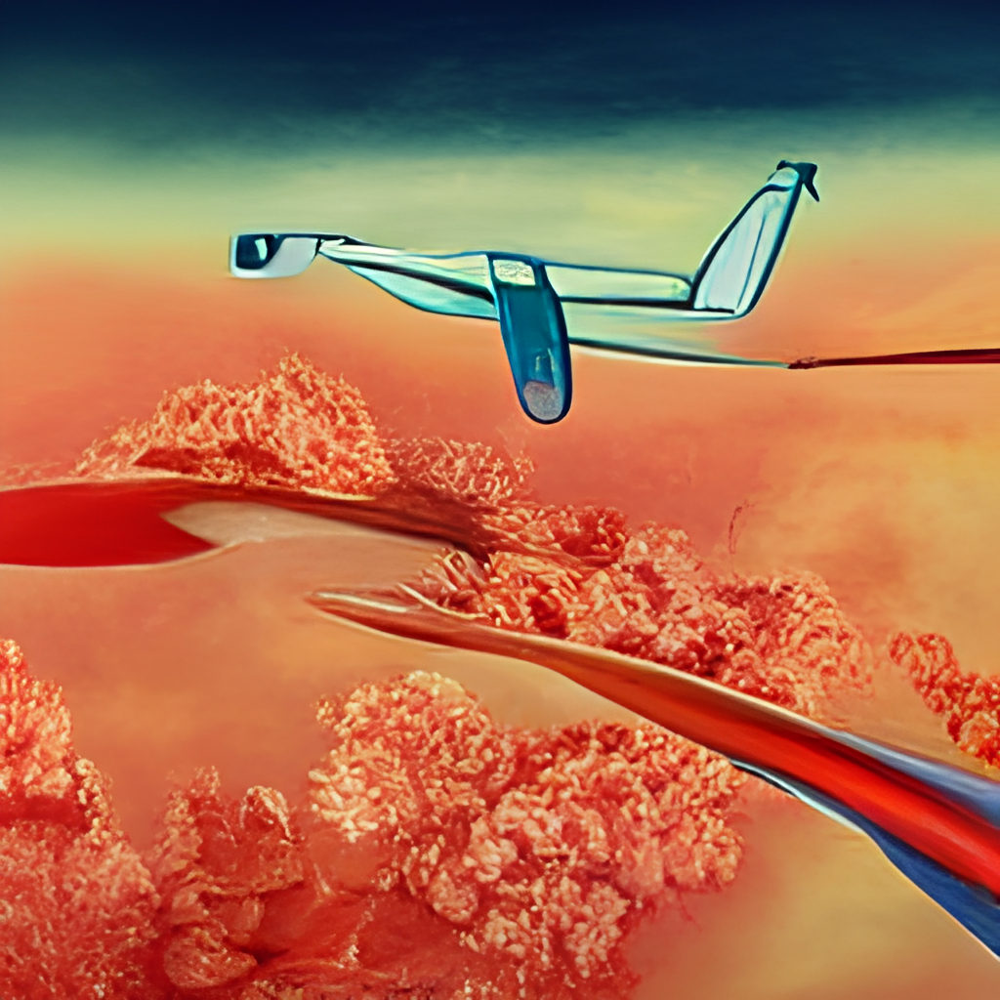

In [18]:
mflw.to_image(img_up)

## Full Configuration

In [10]:
from pathlib import Path

import torch

from min3flow.configuration import BaseConfig, MinDalleConfig, MinDalleExtConfig, Glid3XLConfig, Glid3XLClipConfig, SwinIRConfig
from min3flow.min3flow import Min3Flow

### 0. Configure

In [11]:
dalle_config = MinDalleConfig(dtype=torch.float16)
#glid3xl_config = Glid3XLConfig(guidance_scale=3.0, batch_size=16, steps=100,)
glid3xl_config = Glid3XLClipConfig(clip_guidance_scale=500, guidance_scale=3.0, batch_size=1, steps=100,)
swinir_config = SwinIRConfig()

mflw = Min3Flow(dalle_config=dalle_config, 
                glid3xl_config=glid3xl_config, 
                swinir_config=swinir_config, 
                persist='cpu', 
                seed=42)

### 1. Generate (with MinDalle)

In [12]:
%%time
prompt = 'Dali painting of a glider in infrared'
grid_size = 4 # Will create a grid of (4,4) images. Reduce this if running into OOM errors.
image = mflw.generate(
    prompt, 
    grid_size=grid_size, 
    supercondition_factor=32, 
    temperature=1.0,
)

using device cuda
intializing TextTokenizer
initializing DalleBartEncoder
initializing DalleBartDecoder
initializing VQGanDetokenizer
tokenizing text
['Ġdali']
['Ġpainting']
['Ġof']
['Ġa']
['Ġglider']
['Ġin']
['Ġinfrared']
9 text tokens [0, 21853, 1545, 111, 58, 24228, 91, 15126, 2]
encoding text tokens
detokenizing image
CPU times: user 54.9 s, sys: 6.46 s, total: 1min 1s
Wall time: 30.1 s


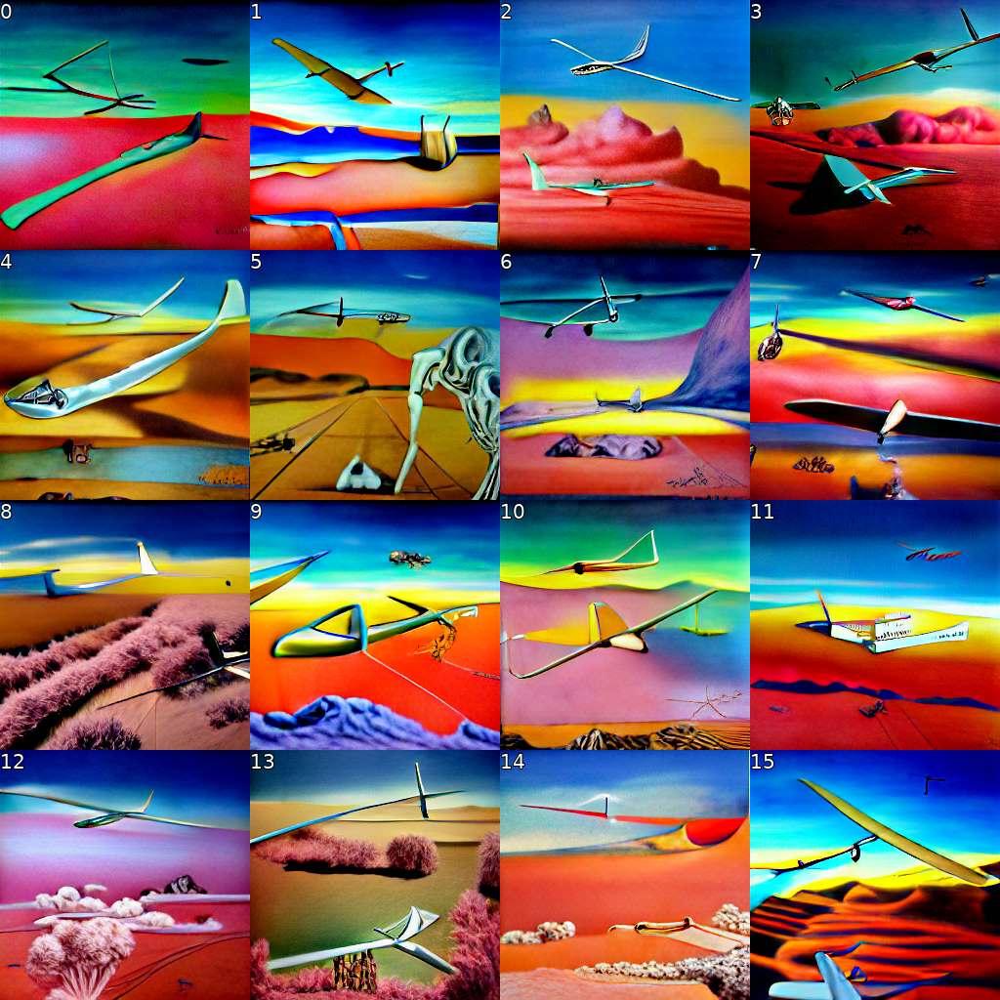

In [13]:
mflw.show_grid(image)

### 2. Diffuse (with Glid3XLClip)

In [37]:
isinstance(mflw.glid3xl_config,Glid3XLClipConfig)

True

In [14]:
%%time
Fav_id = 2
img_diff = mflw.diffuse(image, 
                        grid_idx=Fav_id, 
                        skip_rate=0.5, 
                        text = prompt,)

load_models (5.71s)
load_clip (4.46s)
load_ldm (0.10s)
encode_text (5.42s)


  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 2min 47s, sys: 9.4 s, total: 2min 57s
Wall time: 39.7 s


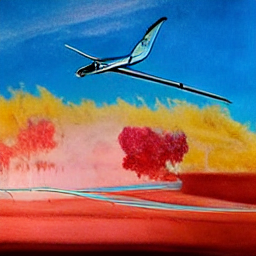

In [15]:
img_diff

In [16]:
print(torch.cuda.max_memory_allocated()/1e9)
torch.cuda.reset_peak_memory_stats()
print(torch.cuda.max_memory_allocated()/1e9)

11.290547712
4.779140096


In [12]:
#print(torch.cuda.memory_summary())

### 3. Upsample (with SwinIR)

In [17]:
%%time
img_up = mflw.upscale(img_diff, tile=None)

CPU times: user 1min 24s, sys: 539 ms, total: 1min 25s
Wall time: 2.68 s


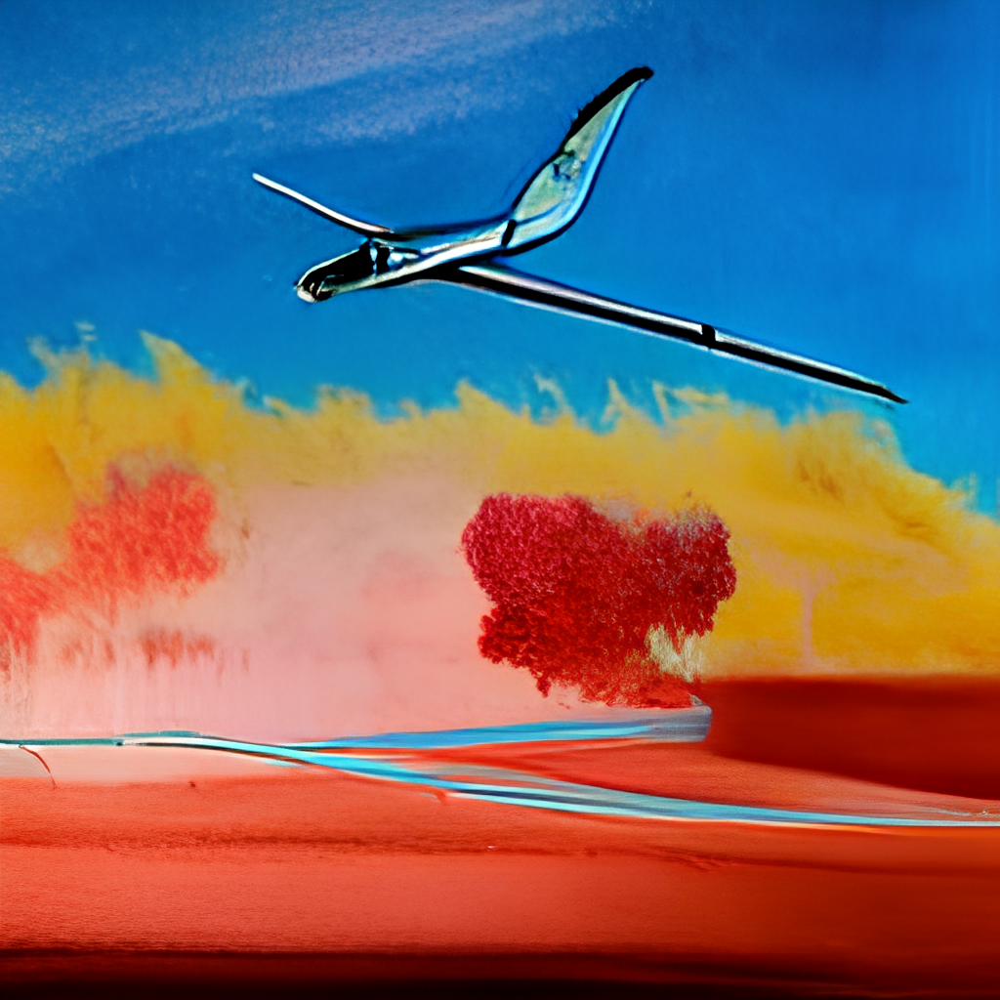

In [18]:
img_up

## Run Again

The overhead for running any stage again is reduced to CPU->GPU transfer rather than disk->CPU->GPU transfer. On average, this reduces the run time by ~50%.

In [19]:
%%time
image = mflw.generate('antique photo of a knight riding a T-Rex', supercondition_factor=16, temperature=1.0)

tokenizing text
['Ġantique']
['Ġphoto']
['Ġof']
['Ġa']
['Ġknight']
['Ġriding']
['Ġa']
['Ġt', '-', 'rex']
12 text tokens [0, 2750, 564, 111, 58, 5397, 8245, 58, 59, 3, 19372, 2]
encoding text tokens
detokenizing image
CPU times: user 12 s, sys: 2.02 s, total: 14.1 s
Wall time: 14.1 s


In [25]:
%%time
imgx = mflw.diffuse(image, grid_idx=3, )

  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 1min 53s, sys: 6.69 s, total: 2min
Wall time: 23.4 s


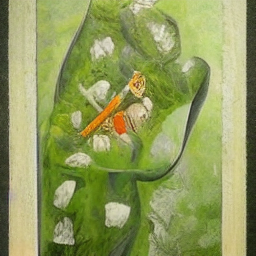

In [26]:
imgx

In [22]:
%%time
imgxu = mflw.upscale(imgx, None)

CPU times: user 43.8 s, sys: 1.92 s, total: 45.7 s
Wall time: 949 ms


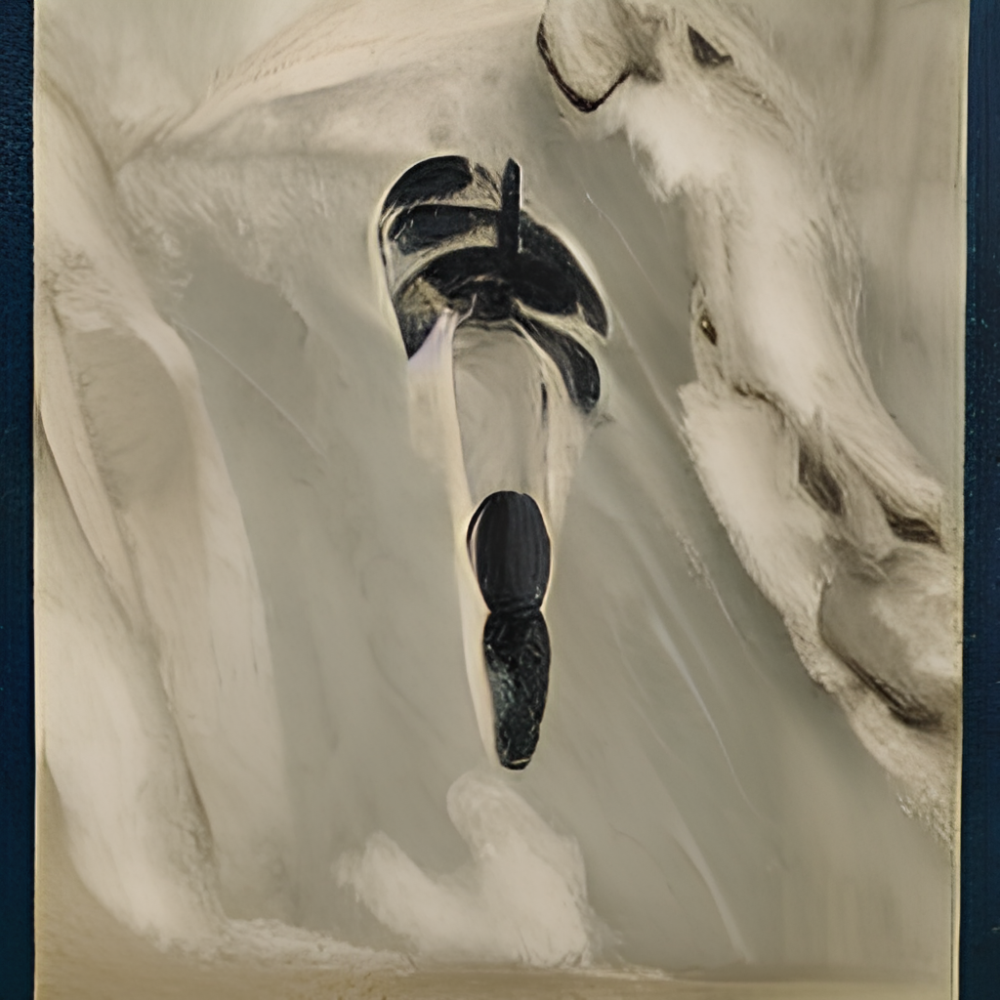

In [23]:
imgxu